<a href="https://colab.research.google.com/github/thepbordin/Billboard-Management/blob/main/Billboard_Instance_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install Detectron 2, torch.

In [ ]:
!python -m pip install pyyaml==5.1
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 4.1 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=decb7c987dcf06c01654f0dca6f6e18042112795c366e20cf8dec7d3d20e0708
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-xjdgwf2d
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-xjdgwf2d
     |████████████████████████████████| 50 kB 2.8 MB/s 
     |████████████████████████████████| 79 kB 

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
torch:  1.11 ; cuda:  cu113
detectron2: 0.6


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Download and Extract Datasets file

## From Kaggle

In [ ]:
! mkdir -p ~/.kaggle
! cp "/content/drive/MyDrive/AI Builders/kaggle.json" ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
#Kaggle Download
!pip install kaggle
!kaggle datasets download -d thepbordin/door-and-path-object-detection-dataset

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
 91% 122M/135M [00:03<00:00, 49.1MB/s]
100% 135M/135M [00:03<00:00, 42.2MB/s]


## From Google Drive

In [ ]:
# import shutil
# shutil.rmtree('/content/data')

In [ ]:
#Extract
!mkdir -p ./data
!unzip "/content/drive/Shareddrives/Intelligent virtual hack/data/train_img.zip" -d "data/"

Archive:  /content/drive/Shareddrives/Intelligent virtual hack/data/train_img.zip
   creating: data/train_img/
  inflating: data/train_img/chrome_0hZYOBMtRq.jpg  
  inflating: data/train_img/chrome_0JCPum612Q.jpg  
  inflating: data/train_img/chrome_0rFnJz2ViY.jpg  
  inflating: data/train_img/chrome_1ONAGu5HDY.jpg  
  inflating: data/train_img/chrome_32TrG3EoIX.jpg  
  inflating: data/train_img/chrome_3lQtMfH7EN.jpg  
  inflating: data/train_img/chrome_485p84YUfv.jpg  
  inflating: data/train_img/chrome_4vraHLl4IV.jpg  
  inflating: data/train_img/chrome_4xHu18ipZy.jpg  
  inflating: data/train_img/chrome_5arKNc9uL7.jpg  
  inflating: data/train_img/chrome_5baj4Wmjsi.jpg  
  inflating: data/train_img/chrome_5iB7XADrKA.jpg  
  inflating: data/train_img/chrome_5JCgEzK0z1.jpg  
  inflating: data/train_img/chrome_6V5McxvS2p.jpg  
  inflating: data/train_img/chrome_86ctkIbLDo.jpg  
  inflating: data/train_img/chrome_8kbEaGaupY.jpg  
  inflating: data/train_img/chrome_8MOcCapATT.jpg  
  inf

In [ ]:
!cp "/content/drive/Shareddrives/Intelligent virtual hack/Labeled/train.json" "/content/data"
!cp "/content/drive/Shareddrives/Intelligent virtual hack/Labeled/test.json" "/content/data"

In [ ]:
!cp -r "/content/drive/Shareddrives/Intelligent virtual hack/split/test" "/content/data"

In [ ]:
import glob
print(f"{len(glob.glob('./data/img/*.jpg'))} files")

0 files


#Register COCO Dataset

In [ ]:
rootdir = "/content/data"
modelsave_dir = "/content/drive/Shareddrives/Intelligent virtual hack/Model Checkpoints/NewModel"

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/data/train.json", "/content/data/train_img")
register_coco_instances("my_dataset_val", {}, "/content/data/test.json", "/content/data/test")

In [ ]:
data_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train") 

dataset_val_dict = DatasetCatalog.get("my_dataset_val") 

[06/12 07:58:50 d2.data.datasets.coco]: Loaded 244 images in COCO format from /content/data/train.json
WARNING [06/12 07:58:50 d2.data.datasets.coco]: /content/data/test.json contains 449 annotations, but only 446 of them match to images in the file.
[06/12 07:58:50 d2.data.datasets.coco]: Loaded 121 images in COCO format from /content/data/test.json


# Show Random Data with annotation

In [ ]:
import random
for d in glob.glob("/content/data/*"):
    img = cv2.imread(d)
    visualizer = Visualizer(img[:, :, ::-1], metadata=data_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

NameError: ignored

# Setup Wandb

In [ ]:
!pip install wandb
!wandb login

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.8 MB 15.2 MB/s 
     |████████████████████████████████| 145 kB 75.8 MB/s 
     |████████████████████████████████| 181 kB 77.0 MB/s 
     |████████████████████████████████| 63 kB 2.2 MB/s 
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8806 sha256=85fe76920651ca2465b4c33d3af51403c0da38d893f626dab7928720776b3914
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built pathtools
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: ERROR API key must be 40 characters long, yours was 41
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+

In [ ]:
import wandb
wandb.init(project="Original_DoorDetect Dataset", entity="thepbordinteam")

wandb: Currently logged in as: thepbordin (thepbordinteam). Use `wandb login --relogin` to force relogin


# Load Model from Modelzoo and Train!


In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train", )
cfg.DATASETS.TEST = ()
cfg.TEST.EVAL_PERIOD = True
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
# cfg.SOLVER.MAX_ITER = round((len(dataset_dicts)/cfg.SOLVER.IMS_PER_BATCH)*20)   
cfg.SOLVER.MAX_ITER = 15000   
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.OUTPUT_DIR = modelsave_dir
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

# wandb.config = {
#   "learning_rate": cfg.SOLVER.BASE_LR,
#   "epochs": cfg.SOLVER.MAX_ITER/250,
#   "batch_size": cfg.SOLVER.IMS_PER_BATCH
# }

In [ ]:
round((len(dataset_dicts)/cfg.SOLVER.IMS_PER_BATCH)*20)    

976

In [ ]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=True)
trainer.train()

[06/11 21:17:07 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[06/11 21:17:07 d2.engine.train_loop]: Starting training from iteration 0
[06/11 21:17:21 d2.utils.events]:  eta: 2:42:53  iter: 19  total_loss: 1.61  loss_cls: 0.7081  loss_box_reg: 0.0661  loss_mask: 0.6923  loss_rpn_cls: 0.1222  loss_rpn_loc: 0.02675  time: 0.6545  data_time: 0.0453  lr: 4.9953e-06  max_mem: 5323M
[06/11 21:17:34 d2.utils.events]:  eta: 2:44:51  iter: 39  total_loss: 1.697  loss_cls: 0.6582  loss_box_reg: 0.07164  loss_mask: 0.6806  loss_rpn_cls: 0.1908  loss_rpn_loc: 0.0431  time: 0.6669  data_time: 0.0307  lr: 9.9902e-06  max_mem: 5323M
[06/11 21:17:48 d2.utils.events]:  eta: 2:47:22  iter: 59  total_loss: 1.404  loss_cls: 0.53  loss_box_reg: 0.06547  loss_mask: 0.6534  loss_rpn_cls: 0.1259  loss_rpn_loc: 0.03393  time: 0.6783  data_time: 0.0224  lr: 1.4985e-05  max_mem: 5323M
[06/11 21:18:02 d2.utils.events]:  eta: 2:48:52  iter: 79  total_loss: 1.302  loss_cls: 0.4279  loss_box_reg: 0.08384  loss_mask: 0.6164  loss_rpn_cls: 0.1239  loss_rpn_loc: 0.04942  time: 0

# Show result with TensorBoard

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir "/content/drive/Shareddrives/Colab Shared Data/Model Checkpoints/"

<IPython.core.display.Javascript object>

# Define Predictor Class

In [ ]:
from detectron2.engine import DefaultTrainer

# cfg = get_cfg()
# cfg.OUTPUT_DIR = "/content/drive/MyDrive/AI Builders/Model Checkpoints"
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.65
predictor = DefaultPredictor(cfg)

[06/12 08:02:48 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

# Show Prediction in validation set

In [ ]:
# Predict examples

['/content/data/test.png']


/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


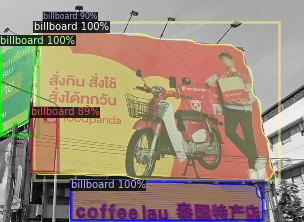

NameError: ignored

In [ ]:
from detectron2.utils.visualizer import ColorMode
files = []
types = ('/content/data/*.png', '/content/data/*.jpg') # the tuple of file types

for f in types:
    files.extend(glob.glob(f))
print(files)
for d in files:    
    im = cv2.imread(d)
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=data_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])
    cv2.imwrite(f'/content/out/{op.basename(d)}',out.get_image()[:, :, ::-1])

In [ ]:
!zip -r "ช่วย.zip" "/content/out"

updating: content/out/ (stored 0%)
updating: content/out/9.jpg (deflated 1%)
updating: content/out/3.png (deflated 4%)
updating: content/out/8.jpg (deflated 1%)
updating: content/out/10.jpg (deflated 1%)
updating: content/out/4.png (deflated 8%)
updating: content/out/6.png (deflated 6%)
updating: content/out/11.jpg (deflated 0%)
updating: content/out/5.png (deflated 5%)
updating: content/out/7.png (deflated 6%)
updating: content/out/12.jpg (deflated 1%)


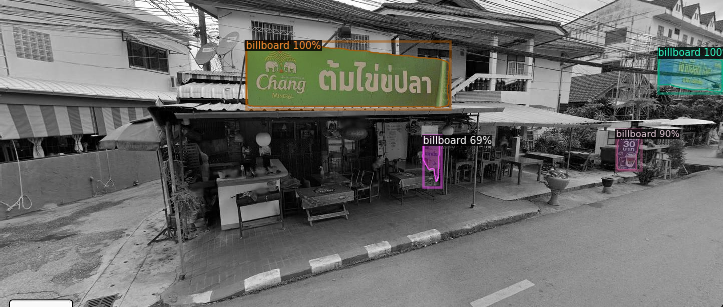

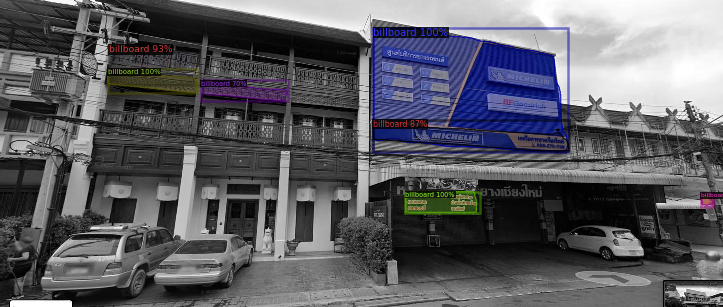

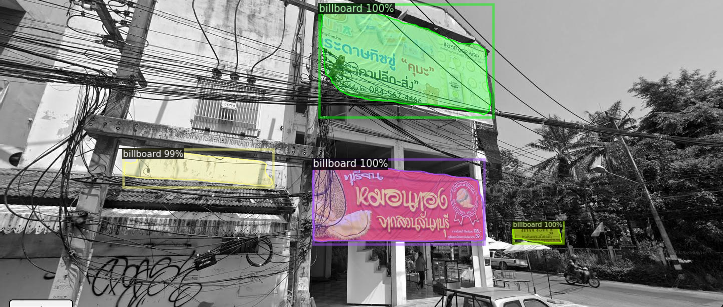

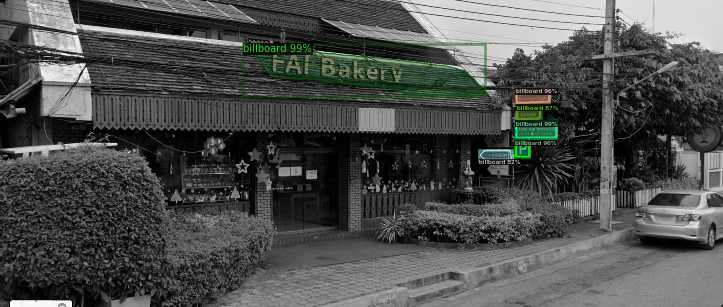

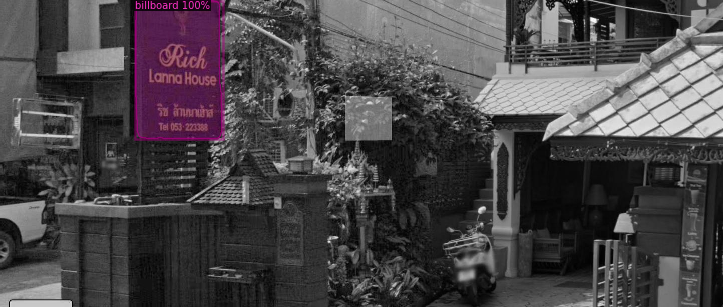

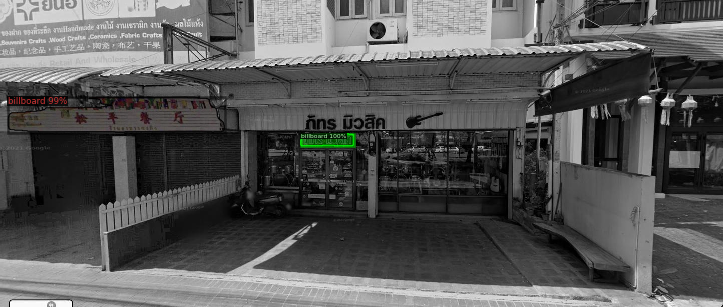

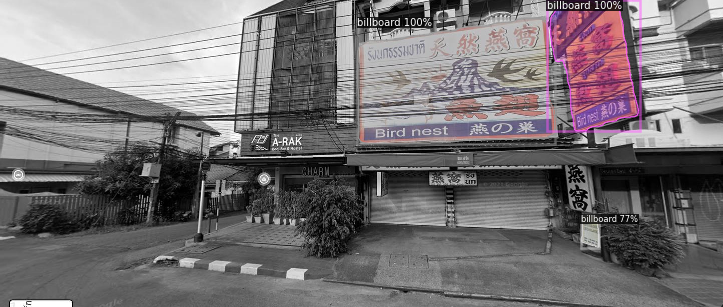

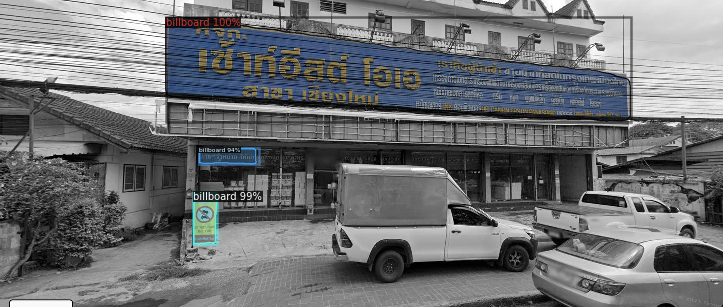

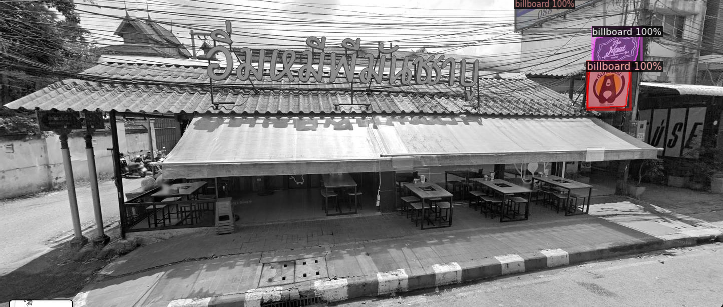

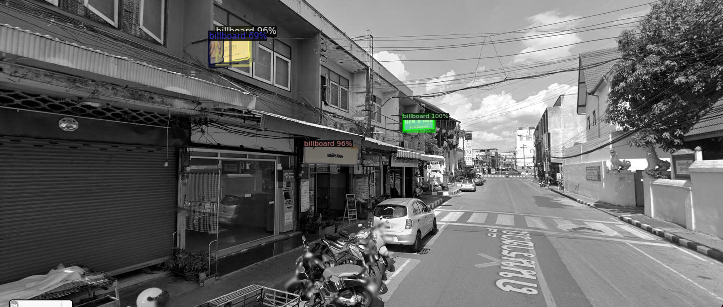

In [ ]:
from detectron2.utils.visualizer import ColorMode
for d in random.sample(dataset_val_dict, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=data_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

# Evaluate Model


In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[06/12 01:24:17 d2.data.datasets.coco]: Loaded 118 images in COCO format from /content/data/test.json
[06/12 01:24:17 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[06/12 01:24:17 d2.data.common]: Serializing 118 elements to byte tensors and concatenating them all ...
[06/12 01:24:17 d2.data.common]: Serialized dataset takes 0.10 MiB
[06/12 01:24:17 d2.evaluation.evaluator]: Start inference on 118 batches
[06/12 01:24:18 d2.evaluation.evaluator]: Inference done 11/118. Dataloading: 0.0013 s/iter. Inference: 0.0635 s/iter. Eval: 0.0191 s/iter. Total: 0.0840 s/iter. ETA=0:00:08
[06/12 01:24:23 d2.evaluation.evaluator]: Inference done 75/118. Dataloading: 0.0026 s/iter. Inference: 0.0622 s/iter. Eval: 0.0145 s/iter. Total: 0.0795 s/iter. ETA=0:00:03
[06/12 01:24:28 d2.evaluation.evaluator]: Inference done 118/118. Dataloading: 0.0050 s/iter. Inference: 0.0699 s/iter. Eval: 

In [ ]:
!zip -r "data2.0.zip" "/content/data"

	zip warning: name not matched: /content/datab

zip error: Nothing to do! (try: zip -r data2.0.zip . -i /content/datab)


# Video Prediction

In [ ]:
from detectron2.engine import DefaultTrainer

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.65
predictor = DefaultPredictor(cfg)

In [ ]:
# Run frame-by-frame inference demo on this video (takes 3-4 minutes) with the "demo.py" tool we provided in the repo.
!git clone https://github.com/facebookresearch/detectron2
# Note: this is currently BROKEN due to missing codec. See https://github.com/facebookresearch/detectron2/issues/2901 for workaround.
%run detectron2/demo/demo.py --config-file detectron2/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml --video-input "/content/data/video_test/IMG_3122.MOV" --confidence-threshold 0.6 --output video-output.mkv \
  --opts MODEL.WEIGHTS "/content/drive/Shareddrives/Intelligent virtual hack/Model Checkpoints/NewModel/model_final.pth"

fatal: destination path 'detectron2' already exists and is not an empty directory.
[06/12 02:48:41 detectron2]: Arguments: Namespace(confidence_threshold=0.6, config_file='detectron2/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml', input=None, opts=['MODEL.WEIGHTS', '/content/drive/Shareddrives/Intelligent virtual hack/Model Checkpoints/NewModel/model_final.pth'], output='video-output.mkv', video_input='/content/data/video_test/IMG_3122.MOV', webcam=False)
[06/12 02:48:42 fvcore.common.checkpoint]: [Checkpointer] Loading from /content/drive/Shareddrives/Intelligent virtual hack/Model Checkpoints/NewModel/model_final.pth ...
WARNING [06/12 02:48:42 d2.checkpoint.c2_model_loading]: Shape of roi_heads.box_predictor.bbox_pred.bias in checkpoint is torch.Size([4]), while shape of roi_heads.box_predictor.bbox_pred.bias in model is torch.Size([320]).
WARNING [06/12 02:48:42 d2.checkpoint.c2_model_loading]: roi_heads.box_predictor.bbox_pred.bias will not be loaded. Please double 

 98%|█████████▊| 85/87 [00:13<00:00,  6.50it/s]


In [ ]:
# Download the results
from google.colab import files
files.download('video-output.mkv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>